100%|██████████| 23/23 [00:00<00:00, 141.40it/s]


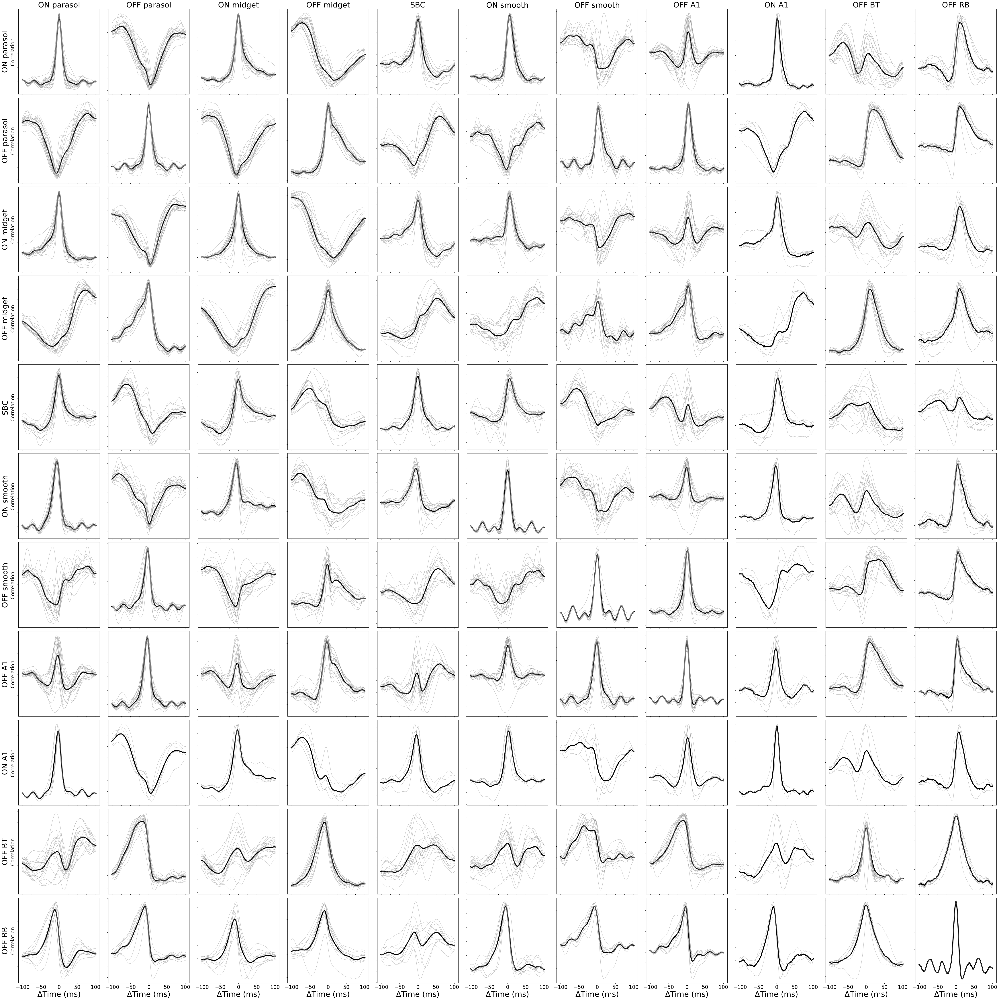

/tmp/ipykernel_49667/2559715735.py:197: RuntimeWarning: invalid value encountered in double_scalars
  score_right[i, j] = (np.dot(cell_right, anchor_right))/(np.sqrt(np.dot(cell_right, cell_right))*np.sqrt(np.dot(anchor_right, anchor_right)))


0         1         2         3         4  \
2005-04-26-1 001 29.0     0.543799 -0.520321  0.823310 -0.237190  0.833261   
                 59.0     0.458406 -0.642410  0.748373 -0.428622  0.723586   
                 198.0    0.756884 -0.310382  0.923267 -0.025040  0.941163   
                 276.0    0.599430 -0.422664  0.831796 -0.151559  0.859678   
                 533.0    0.787298 -0.324058  0.827675 -0.217921  0.728956   
...                            ...       ...       ...       ...       ...   
2019-08-27-0 005 1301.0   0.677133  0.131175  0.554484  0.243219  0.531024   
                 1305.0   0.706015  0.055914  0.624198  0.180769  0.592532   
                 1311.0   0.799909 -0.280286  0.899081 -0.015358  0.894696   
                 91350.0  0.362211  0.801165 -0.091773  0.723548 -0.039431   
                 91369.0  0.796688 -0.081330  0.779671  0.106147  0.751901   

                                 5         6         7         8         9  \
2005-04-26-1 001 29.0     0.860711  0.163683  0.286076  0.786736  0.744558   
                 59.0     0.784426  0.031755  0.202794  0.661795  0.690740   
                 198.0    0.925542  0.429073  0.545310  0.921377  0.867890   
                 276.0    0.880324  0.128615  0.263507  0.790058  0.727468   
                 533.0    0.712913  0.679823  0.850401  0.807054  0.931380   
...                            ...       ...       ...       ...       ...   
2019-08-27-0 005 1301.0   0.433490  0.925628  0.916401  0.652432  0.652215   
                 1305.0   0.500236  0.904397  0.922037  0.703741  0.718710   
                 1311.0   0.866155  0.615333  0.701342  0.917971  0.883274   
                 91350.0 -0.152463  0.608288  0.480553  0.054870 -0.049226   
                 91369.0  0.681515  0.847511  0.900284  0.838865  0.843466   

                          ...        14        15        16        17  \
2005-04-26-1 001 29.0     ... -0.909615  0.703263  0.965855 -0.886101   
                 59.0     ... -0.891275  0.732625  0.959989 -0.885616   
                 198.0    ... -0.932351  0.665834  0.940992 -0.892664   
                 276.0    ... -0.890096  0.717684  0.918734 -0.929243   
                 533.0    ...  0.936566 -0.478375 -0.835217  0.918504   
...                       ...       ...       ...       ...       ...   
2019-08-27-0 005 1301.0   ...  0.880061 -0.565066 -0.814298  0.978467   
                 1305.0   ...  0.912405 -0.657187 -0.911941  0.970297   
                 1311.0   ...  0.859627 -0.640037 -0.856702  0.974628   
                 91350.0  ...  0.190367  0.255268  0.146203  0.391032   
                 91369.0  ...  0.877265 -0.557909 -0.810160  0.972102   

                                18        19        20        21  \
2005-04-26-1 001 29.0    -0.909439  0.927186 -0.624796 -0.671278   
                 59.0    -0.908616  0.919517 -0.561929 -0.616580   
                 198.0   -0.907815  0.888714 -0.645153 -0.695288   
                 276.0   -0.945581  0.851503 -0.570351 -0.669437   
                 533.0    0.936515 -0.758477  0.820316  0.896136   
...                            ...       ...       ...       ...   
2019-08-27-0 005 1301.0   0.989213 -0.703750  0.643592  0.775208   
                 1305.0   0.979396 -0.823156  0.588156  0.677544   
                 1311.0   0.987855 -0.757387  0.540311  0.659486   
                 91350.0  0.348859  0.332451  0.087988  0.229407   
                 91369.0  0.984973 -0.702816  0.663765  0.795386   

                              piece_id       label  
2005-04-26-1 001 29.0     2005-04-26-1   ON smooth  
                 59.0     2005-04-26-1   ON smooth  
                 198.0    2005-04-26-1   ON smooth  
                 276.0    2005-04-26-1   ON smooth  
                 533.0    2005-04-26-1  OFF smooth  
...                                ...         ...  
2019-08-27-0 005 1301.0   2019-08-27-0  OFF smooth  
                 1305.0   2019-08-27-0  O

In [1]:
import sys, os
sys.path.append("/Volumes/Lab/Users/bhofflic/cell_classification/src")
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sklearn
import scipy
from file_handling import wrapper
from tqdm import tqdm

from sklearn.decomposition import PCA

%load_ext autoreload
%autoreload 2
cch_data = pd.read_pickle('/Volumes/Scratch/Users/bhofflic/correlations/average_cchs.pkl')
training_data = pd.read_pickle('/Volumes/Scratch/Users/bhofflic/correlations/training_data.pkl')
runs_to_drop = [('2018-03-01-6','004'),
                ('2015-09-23-7','037'),
                ('2016-02-17-8','018'),
                ('2016-02-17-8','013'),
                ('2016-02-17-8','017'),
                ('2018-08-07-2','005'),
                ('2018-08-07-9','013'),
                ('2018-08-07-11','011'),
                ('2017-03-15-1','028')]
classification_types = ['ON parasol', 'OFF parasol', 'ON midget', 'OFF midget', 
                        'SBC', 'ON smooth', 'OFF smooth', 
                        'OFF A1', 'ON A1', 'OFF BT', 'OFF RB']
num_types = len(classification_types)
delays = cch_data.iloc[0].delays.a
cch_length = len(delays)

middle_bound = [100,120]
min_bound = [107-middle_bound[0],114 - middle_bound[1]]
max_bound = [100-middle_bound[0],117 - middle_bound[1]]
## Preprocessing ##
held_out_pcs = {}
for piece in tqdm(training_data.piece_id.unique()):
    anchor_pcs = {'1ms':{}, '10ms':{}}
    rows = training_data[(training_data.piece_id != piece)]
    for anchor_type in classification_types:
        anchor_rows = rows[anchor_type]
        anchor_cchs_1ms = np.array([anchor_rows.iloc[i].a[0,:][middle_bound[0]:middle_bound[1]] 
                            for i in range(len(anchor_rows)) if anchor_rows.iloc[i] is not None])
        anchor_cchs_10ms = np.array([anchor_rows.iloc[i].a[1,:]
                            for i in range(len(anchor_rows)) if anchor_rows.iloc[i] is not None])
        if len(anchor_cchs_1ms) < 0:
            continue
        anchor_cchs_1ms -= np.min(anchor_cchs_1ms[:,min_bound[0]:min_bound[1]], axis=1)[:,np.newaxis]
        
        max_val = np.max(anchor_cchs_1ms[:,max_bound[0]:max_bound[1]], axis=1)
        anchor_cchs_1ms = anchor_cchs_1ms[max_val > 0]
        anchor_cchs_1ms /= np.max(anchor_cchs_1ms[:,max_bound[0]:max_bound[1]], axis=1)[:,np.newaxis]
        anchor_cchs_1ms = anchor_cchs_1ms[~np.isnan(anchor_cchs_1ms).any(axis=1)]

        anchor_cov_1ms = np.cov(anchor_cchs_1ms.T)
        anchor_cov_10ms = np.cov(anchor_cchs_10ms.T)

        pca_1ms = PCA(n_components=8)
        pca_10ms = PCA(n_components=8)

        pca_1ms.fit(anchor_cchs_1ms)
        pca_10ms.fit(anchor_cchs_10ms)

        anchor_pcs['1ms'][anchor_type] = pca_1ms.components_
        anchor_pcs['10ms'][anchor_type] = pca_10ms.components_
    held_out_pcs[piece] = anchor_pcs
    
import warnings
pc_training_data = training_data.copy()
for piece in tqdm(training_data.piece_id.unique()):
    rows = training_data[training_data.piece_id == piece]
    for anchor_type in classification_types:
        anchor_rows = rows[anchor_type]
        anchor_cchs_1ms = np.array([anchor_rows.iloc[i].a[0,:][middle_bound[0]:middle_bound[1]] \
                            if anchor_rows.iloc[i] is not None else np.zeros(middle_bound[1]-middle_bound[0])*np.nan for i in range(len(anchor_rows))])
        anchor_cchs_10ms = np.array([anchor_rows.iloc[i].a[1,:] \
                            if anchor_rows.iloc[i] is not None else np.zeros(cch_length)*np.nan for i in range(len(anchor_rows))])
        
        not_nan_mask = ~np.isnan(anchor_cchs_1ms).any(axis=1)
        anchor_cchs_1ms[not_nan_mask] -= np.min(anchor_cchs_1ms[not_nan_mask][:,min_bound[0]:min_bound[1]], axis=1)[:,np.newaxis]
        
        max_val = np.max(anchor_cchs_1ms[:,max_bound[0]:max_bound[1]], axis=1)
        not_nan_max_mask = max_val > 0
        
        anchor_cchs_1ms[not_nan_max_mask] /= np.max(anchor_cchs_1ms[not_nan_max_mask][:,max_bound[0]:max_bound[1]], axis=1)[:,np.newaxis]
        # transformed_1ms = np.dot(anchor_cchs_1ms[not_nan_max_mask], held_out_pcs[piece]['1ms'][anchor_type].T)
        # transformed_1ms = np.dot(transformed_1ms, held_out_pcs[piece]['1ms'][anchor_type])
        transformed_10ms = np.dot(anchor_cchs_10ms[not_nan_max_mask], held_out_pcs[piece]['10ms'][anchor_type].T)
        transformed_10ms = np.dot(transformed_10ms, held_out_pcs[piece]['10ms'][anchor_type])
        
        # anchor_cchs_1ms[not_nan_max_mask] = transformed_1ms
        anchor_cchs_10ms[not_nan_max_mask] = transformed_10ms
        
        transformed_data = [(anchor_cchs_1ms[i],anchor_cchs_10ms[i]) for i in range(len(anchor_rows))]
        
        pc_training_data.loc[anchor_rows.index, anchor_type] = [wrapper(transformed_data[i]) for i in range(len(anchor_rows))]
        
        
        
piece_templates = {}
for piece in tqdm(pc_training_data.piece_id.unique()):
    type_pair_templates = {}
    rows = pc_training_data[pc_training_data.piece_id == piece]
    for classify_type in classification_types:
        class_rows = rows.query("cell_type == @classify_type")
        for anchor_type in classification_types:
            pair_rows = class_rows[anchor_type]
            pair_cchs_1ms = np.array([pair_rows.iloc[i].a[0] for i in range(len(pair_rows)) if np.isnan(pair_rows.iloc[i].a[0]).any() == False])
            pair_cchs_10ms = np.array([pair_rows.iloc[i].a[1] for i in range(len(pair_rows)) if np.isnan(pair_rows.iloc[i].a[1]).any() == False])
            if len(pair_cchs_1ms) == 0:
                continue
            pair_templates_1ms = np.mean(pair_cchs_1ms, axis=0)
            pair_templates_10ms = np.mean(pair_cchs_10ms, axis=0)
            type_pair_templates[(classify_type,anchor_type)] = (pair_templates_1ms, pair_templates_10ms)
    piece_templates[piece] = type_pair_templates
held_out_templates = {}
for piece in tqdm(training_data.piece_id.unique()):
    join_templates = {}
    for piece_id in training_data.piece_id.unique():
        if piece_id == piece:
            continue
        for pair, templates in piece_templates[piece_id].items():
            if pair not in join_templates:
                join_templates[pair] = [templates]
            else:
                join_templates[pair] = join_templates[pair] + [templates]
    avg_templates = {}
    for pair, templates in join_templates.items():
        avg_templates[pair] = (np.mean([t[0] for t in templates], axis=0), np.mean([t[1] for t in templates], axis=0))
    held_out_templates[piece] = avg_templates
import matplotlib.pyplot as plt

# Assuming 'num_types', 'type_pair_templates', and 'delays' are defined
plt.figure(figsize=(5*num_types, 5*num_types))

piece = '2018-03-01-6'
type_pair_templates = held_out_templates[piece]
type_pairs = [(t1, t2) for t1 in classification_types for t2 in classification_types]
for i, type_pair in enumerate(type_pairs):
    if type_pair not in type_pair_templates:
        continue
    ax = plt.subplot(num_types, num_types, i+1)
    ax.plot(delays*1000, type_pair_templates[type_pair][1], linewidth = 4, color='black')
    for piece_id in piece_templates.keys():
        if piece_id == piece:
            continue
        if type_pair in piece_templates[piece_id]:
            ax.plot(delays*1000, piece_templates[piece_id][type_pair][1], linewidth = 1, color='gray', alpha=0.5)
    
    # Manage x-ticks and y-ticks visibility
    if (i // num_types) != (num_types - 1):  # Not in the last row
        ax.set_xticklabels([])  # Hide x-tick labels
        
    ax.set_yticklabels([])  # Hide y-tick labels

    # Labels for type_pair[0] and type_pair[1]
    if (i % num_types) == 0:  # First column
        ax.set_ylabel(type_pair[0], fontsize=30, labelpad=30)  # Adjust labelpad as needed
        ax.text(-0.1, 0.5, 'Correlation', transform=ax.transAxes, fontsize=20,
                verticalalignment='center', rotation='vertical')
    if (i // num_types) == 0:  # First row
        ax.set_title(type_pair[1],fontsize=30)  # Horizontal labels for type_pair[1]
    if (i // num_types) == (num_types - 1):  # Last row
        # ax.set_xticks([-100,-50,0,50,100])
        ax.tick_params(axis='x', labelsize=20)
        ax.set_xlabel('ΔTime (ms)', fontsize=30)  # Adjust labelpad as needed

plt.tight_layout()
plt.show()


In [2]:

cutoff = 8
# anchor_types = classification_types
# anchor_types= classification_types
# anchor_types = classification_types[:cutoff]
anchor_types = ['OFF parasol']
# anchor_types = ['ON midget', 'OFF midget']
# classify_types = [ctype for ctype in classification_types if ctype not in anchor_types + ['ON parasol', 'OFF parasol', 'ON midget', 'OFF midget', 'OFF A1','OFF blobby amacrine']]
# classify_types = classification_types[cutoff:]
classify_types = ["SBC","ON smooth", "OFF smooth","ON A1", "OFF BT", "OFF RB"]

pc_training_data
good_data = pc_training_data.query("cell_type in @classify_types")
scores = {}
for idx, cell in good_data.iterrows():
    score_right = np.zeros((len(classification_types), len(anchor_types)))*np.nan
    score_10 = np.zeros((len(classification_types), len(anchor_types)))*np.nan
    templates = held_out_templates[cell['piece_id']]
    for i, ctype in enumerate(classification_types):
        for j, anchor_type in enumerate(anchor_types):
            if cell[anchor_type] is np.nan:
                continue
            if (ctype, anchor_type) not in templates.keys():
                continue
            cell_right = (cell[anchor_type].a[0])
            anchor_right = (templates[(ctype, anchor_type)][0])
            score_right[i, j] = (np.dot(cell_right, anchor_right))/(np.sqrt(np.dot(cell_right, cell_right))*np.sqrt(np.dot(anchor_right, anchor_right)))
            # score_right[i,j] = 1 / np.linalg.norm(cell_right - anchor_right, 2)
            # if anchor_type == 'OFF A1':
            #     score_right[i,j] *= 10
            cell_10 = (cell[anchor_type].a[1])
            anchor_10 = (templates[(ctype, anchor_type)][1])
            score_10[i, j] = (np.dot(cell_10, anchor_10))/(np.sqrt(np.dot(cell_10, cell_10))*np.sqrt(np.dot(anchor_10, anchor_10)))
            # score_10[i,j] = np.linalg.norm(cell[anchor_type]['10ms'] - pc_templates_10[(ctype, anchor_type)])
    # cell_scores = np.concatenate([score_left.flatten(), score_middle.flatten(), score_right.flatten(), score_10.flatten()])
    cell_scores = np.concatenate([score_right.flatten(), score_10.flatten()])
    scores[(cell['piece_id'], cell['run_id'], cell['unit_id'])] = cell_scores
scores = pd.DataFrame(scores).T
# scores = scores.apply(lambda x: x.fillna(x.mean()), axis=0)
scores = scores.fillna(-1)
scores.loc[:, 'piece_id'] = good_data['piece_id'].values
scores.loc[:, 'label'] = good_data['cell_type'].values
# scores = scores.dropna()
scores

/tmp/ipykernel_49667/4014321255.py:26: RuntimeWarning: invalid value encountered in double_scalars
  score_right[i, j] = (np.dot(cell_right, anchor_right))/(np.sqrt(np.dot(cell_right, cell_right))*np.sqrt(np.dot(anchor_right, anchor_right)))


0         1         2         3         4  \
2005-04-26-1 001 29.0     0.543799 -0.520321  0.823310 -0.237190  0.833261   
                 59.0     0.458406 -0.642410  0.748373 -0.428622  0.723586   
                 198.0    0.756884 -0.310382  0.923267 -0.025040  0.941163   
                 276.0    0.599430 -0.422664  0.831796 -0.151559  0.859678   
                 533.0    0.787298 -0.324058  0.827675 -0.217921  0.728956   
...                            ...       ...       ...       ...       ...   
2019-08-27-0 005 1301.0   0.677133  0.131175  0.554484  0.243219  0.531024   
                 1305.0   0.706015  0.055914  0.624198  0.180769  0.592532   
                 1311.0   0.799909 -0.280286  0.899081 -0.015358  0.894696   
                 91350.0  0.362211  0.801165 -0.091773  0.723548 -0.039431   
                 91369.0  0.796688 -0.081330  0.779671  0.106147  0.751901   

                                 5         6         7         8         9  \
2005-04-26-1 001 29.0     0.860711  0.163683  0.286076  0.786736  0.744558   
                 59.0     0.784426  0.031755  0.202794  0.661795  0.690740   
                 198.0    0.925542  0.429073  0.545310  0.921377  0.867890   
                 276.0    0.880324  0.128615  0.263507  0.790058  0.727468   
                 533.0    0.712913  0.679823  0.850401  0.807054  0.931380   
...                            ...       ...       ...       ...       ...   
2019-08-27-0 005 1301.0   0.433490  0.925628  0.916401  0.652432  0.652215   
                 1305.0   0.500236  0.904397  0.922037  0.703741  0.718710   
                 1311.0   0.866155  0.615333  0.701342  0.917971  0.883274   
                 91350.0 -0.152463  0.608288  0.480553  0.054870 -0.049226   
                 91369.0  0.681515  0.847511  0.900284  0.838865  0.843466   

                          ...        14        15        16        17  \
2005-04-26-1 001 29.0     ... -0.909615  0.703263  0.965855 -0.886101   
                 59.0     ... -0.891275  0.732625  0.959989 -0.885616   
                 198.0    ... -0.932351  0.665834  0.940992 -0.892664   
                 276.0    ... -0.890096  0.717684  0.918734 -0.929243   
                 533.0    ...  0.936566 -0.478375 -0.835217  0.918504   
...                       ...       ...       ...       ...       ...   
2019-08-27-0 005 1301.0   ...  0.880061 -0.565066 -0.814298  0.978467   
                 1305.0   ...  0.912405 -0.657187 -0.911941  0.970297   
                 1311.0   ...  0.859627 -0.640037 -0.856702  0.974628   
                 91350.0  ...  0.190367  0.255268  0.146203  0.391032   
                 91369.0  ...  0.877265 -0.557909 -0.810160  0.972102   

                                18        19        20        21  \
2005-04-26-1 001 29.0    -0.909439  0.927186 -0.624796 -0.671278   
                 59.0    -0.908616  0.919517 -0.561929 -0.616580   
                 198.0   -0.907815  0.888714 -0.645153 -0.695288   
                 276.0   -0.945581  0.851503 -0.570351 -0.669437   
                 533.0    0.936515 -0.758477  0.820316  0.896136   
...                            ...       ...       ...       ...   
2019-08-27-0 005 1301.0   0.989213 -0.703750  0.643592  0.775208   
                 1305.0   0.979396 -0.823156  0.588156  0.677544   
                 1311.0   0.987855 -0.757387  0.540311  0.659486   
                 91350.0  0.348859  0.332451  0.087988  0.229407   
                 91369.0  0.984973 -0.702816  0.663765  0.795386   

                              piece_id       label  
2005-04-26-1 001 29.0     2005-04-26-1   ON smooth  
                 59.0     2005-04-26-1   ON smooth  
                 198.0    2005-04-26-1   ON smooth  
                 276.0    2005-04-26-1   ON smooth  
                 533.0    2005-04-26-1  OFF smooth  
...                                ...         ...  
2019-08-27-0 005 1301.0   2019-08-27-0  OFF smooth  
                 1305.0   2019-08-27-0  O

In [17]:
target_uid = ('2017-11-29-0', '014', 45)
good_data.loc[target_uid]

piece_id                                                    2017-11-29-0
run_id                                                               014
unit_id                                                             45.0
cell_type                                                         OFF RB
ON parasol             (array([ 0.69612959,  0.32780114,  0.37558029,...
OFF parasol            (array([0.94779799, 0.91743861, 0.92048062, 1....
ON midget              (array([0.09317055, 0.15156363, 0.27594296, 0....
OFF midget             (array([ 0.83386109,  0.54594624,  1.        ,...
SBC                    (array([nan, nan, nan, nan, nan, nan, nan, nan...
ON smooth              (array([nan, nan, nan, nan, nan, nan, nan, nan...
OFF smooth             (array([ 1.        ,  0.82493766,  0.72502078,...
ON A1                  (array([nan, nan, nan, nan, nan, nan, nan, nan...
OFF A1                 (array([ 0.32623538,  0.37068686,  0.39470168,...
OFF BT                 (array([ 0.45458216,  0.0908

## Score Diagram ##

In [10]:
import cell_display_lib as cdl
ct = cdl.CellTable()
ct.file_load_pieces(f'/Volumes/Scratch/Users/bhofflic/celltable_runs/', [target_cell['piece_id']])

~ Welcome to the CellTable ~experience~
~ 
~ Starting a fresh new CellTable
~ Loading 1 pieces from /Volumes/Scratch/Users/bhofflic/celltable_runs/: /Volumes/Scratch/Users/bhofflic/celltable_runs/
*** timer  started
Loading piece 2017-11-29-0
~ Successfully loaded piece 2017-11-29-0
*** elapsed 227s of 227s = 3.8m elapsed, of 3.8m estimated (1/1) (0.0 / sec)
~ Processing labels (replace nan, update label encoder and unique names)
Copying cell labels to units
combined mode
~ Done loading, time to analyze.


In [11]:
def plot_highlighted_mosaic(ct, unit_pair, fig, ax):
    ref_unit = ct.unit_table.query("run_id == @max_run[0] and cell_id == @ref_uid").iloc[0]
    comp_unit = ct.unit_table.query("run_id == @max_run[0] and cell_id == @comp_uid").iloc[0]
    
    assert ref_unit['run_id'] == comp_unit['run_id'] and ref_unit['dataset_id'] == comp_unit['dataset_id']
    run_id = ref_unit['run_id']
    
    ref_type = ref_unit['label_manual_text']
    ref_type_units = ct.unit_table.query('run_id == @run_id and label_manual_text == @ref_type and valid == True')
    
    comp_type = comp_unit['label_manual_text']
    comp_type_units = ct.unit_table.query('run_id == @run_id and label_manual_text == @comp_type and valid == True')
    
    for uid, unit in ref_type_units.iterrows():
        for segments in unit['rf_convex_hull'].a:
            if uid == ref_unit.name:
                ax.plot(segments[:,0], segments[:,1], linewidth=1, color = 'b', alpha = 1)
            else:
                ax.plot(segments[:,0], segments[:,1], linewidth=0.75, color = 'k', alpha = 0.1)
    for uid, unit in comp_type_units.iterrows():
        for segments in unit['rf_convex_hull'].a:
            if uid == comp_unit.name:
                ax.plot(segments[:,0], segments[:,1], linewidth=1, color = 'r', alpha = 1)
            else:
                # continue
                ax.plot(segments[:,0], segments[:,1], linewidth=0.75, color = 'k', alpha = 0.1)
    ax.set_aspect('equal')
    ax.set_xticks([])
    ax.set_yticks([])
    return fig, ax

57
520


(828.9356463799792, 1732.0021750916428, 570.7790438673292, 1545.959907611584)

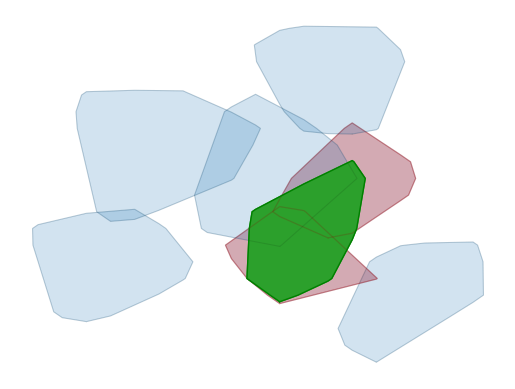

In [20]:
run_id = target_cell['run_id']
target_uid = (target_cell.piece_id, run_id, target_cell.unit_id)
ref_type = target_cell['cell_type']
on_parasols = ct.unit_table.query('run_id == @run_id and label_manual_text == "OFF A1" and valid == True')
on_parasol_ids = []
cell_ids = []
for uid, unit in on_parasols.iterrows():
    cell_id = unit['cell_id']
    if cell_id not in cell_ids:
        on_parasol_ids.append(get_merged_unit(ct.unit_table,uid))
        cell_ids.append(cell_id)
        
run_dataset = ct.dataset_table.loc[(target_cell.piece_id,target_cell.run_id)]
overlaps = run_dataset['rf_overlaps'].a
ids = run_dataset['overlap_ids'].a
target_unit = ct.unit_table.loc[target_uid]
target_idx = np.where(ids == target_unit.name)[0][0]

# for segments in target_unit['rf_convex_hull'].a:
#     plt.plot(segments[:,0], segments[:,1], linewidth=0.75, color = 'k', alpha = 0.1)
#     plt.fill(segments[:,0], segments[:,1], linewidth=0.75, color = 'tab:green', alpha = 0.7)
    # plt.scatter(target_unit['rf_center_x'], target_unit['rf_center_y'], color='r')

on_parasols = ct.unit_table.loc[on_parasol_ids]
for uid, unit in on_parasols.iterrows():
    rf_center_x = on_parasols.at[uid,'rf_center_x']
    rf_center_y = on_parasols.at[uid,'rf_center_y']
    unit_idx = np.where(ids == unit.name)[0][0]
    overlap = overlaps[target_idx, unit_idx]
    if overlap > 0.1 and overlap < 3:
        for segments in unit['rf_convex_hull'].a:
            plt.plot(segments[:,0], segments[:,1], linewidth=0.75, color = 'k', alpha = 0.1)
            plt.fill(segments[:,0], segments[:,1], linewidth=0.75, color = 'tab:blue', alpha = 0.2)
        if overlap < 1:
            # plt.plot([rf_center_x, target_unit['rf_center_x']], [rf_center_y, target_unit['rf_center_y']], color='r',linestyle='dashed')
            # plt.scatter(rf_center_x, rf_center_y, color='r')
            plt.plot(segments[:,0], segments[:,1], linewidth=1, color = 'r', alpha = 0.1)
            plt.fill(segments[:,0], segments[:,1], linewidth=0.75, color = 'tab:red', alpha = 0.3)
            print(unit_idx)

for segments in target_unit['rf_convex_hull'].a:
    plt.plot(segments[:,0], segments[:,1], linewidth=1, color = 'g')
    plt.fill(segments[:,0], segments[:,1], linewidth=1, color = 'tab:green', alpha = 1)
plt.axis('off')

(-0.1111, 0.1111, -0.04115085, 0.50880185)

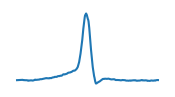

In [13]:
delays = run_dataset['cch_delays'].a
cchs = run_dataset['cch_10ms'].a
plt.figure(figsize=(2,1),facecolor='none')
ax = plt.axes(facecolor='none')
ax.plot(delays,cchs[target_idx,520])
ax.axis('off')

In [14]:
cch = cchs[target_idx,[32,51]] - np.mean(np.concatenate((cchs[target_idx,[32,51]][:,:10],cchs[target_idx,[32,51]][:,-10:]),axis=1),axis=1)[:,np.newaxis]
avg_cch = np.average(cch/np.max(np.abs(cch),axis=1)[:,np.newaxis], axis=0, weights=1/overlaps[target_idx,[32,51]])

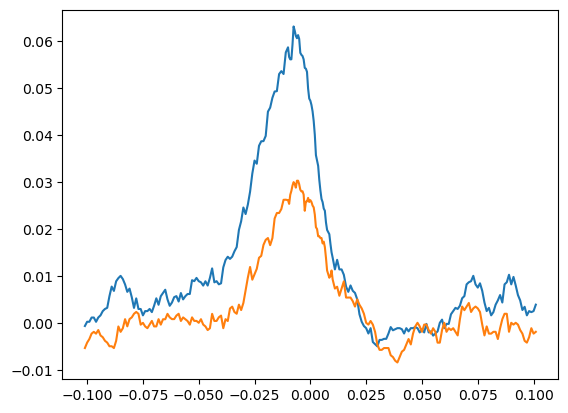

In [15]:
valid_anchor_indices = [32,51]
cchs_1ms = cchs[target_idx, valid_anchor_indices, :]
cchs_1ms -= np.mean(np.concatenate((cchs_1ms[:,:10],cchs_1ms[:,-10:]), axis=1))
plt.plot(delays, cchs_1ms.T)

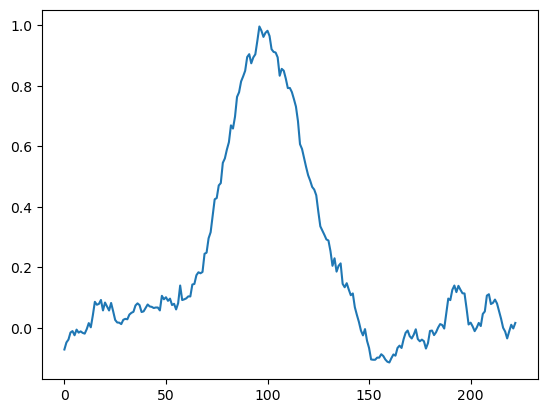

In [41]:
weights = 1/overlaps[target_idx, valid_anchor_indices]
avg_cch = np.average(cchs_1ms/np.max(np.abs(cchs_1ms),axis=1)[:,None], axis=0, weights=weights)
plt.plot(avg_cch)